## This notebook will be mainly used for the capstone project.

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

print ("Hello Capstone Project Course!")

Hello Capstone Project Course!


In [2]:
# The code was removed by Watson Studio for sharing.

/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [3]:
df_collisions[ df_collisions['ROADCOND'].isnull()]['INCKEY'].count()
print ( "empty X: ", df_collisions[ df_collisions['X'].isnull()]['INCKEY'].count() )
print ( "empty Y: ", df_collisions[ df_collisions['Y'].isnull()]['INCKEY'].count() )

df_col = df_collisions[df_collisions['X'].notna()]
print ( "empty X: ", df_col[ df_col['X'].isnull()]['INCKEY'].count() )
print ( "empty Y: ", df_col[ df_col['Y'].isnull()]['INCKEY'].count() )


empty X:  5334
empty Y:  5334
empty X:  0
empty Y:  0


In [28]:
df_col = df_col[['X', 'Y', 'INCKEY', 'LOCATION', 'SEVERITYCODE', 'SEVERITYDESC', 'COLLISIONTYPE', 'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC', 'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR']]
df_col.describe(include=['object'])

,LOCATION,SEVERITYDESC,COLLISIONTYPE,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,ST_COLCODE,ST_COLDESC,HITPARKEDCAR
count,189339,189339,184582,189339,189339,185146,189339,29176,184602,184414,184481,184327,4645,8720,189321,189339,189339
unique,23890,2,10,5985,157960,7,39,1,4,11,9,9,1,1,115,63,2
top,N NORTHGATE WAY BETWEEN MERIDIAN AVE N AND COR...,Property Damage Only Collision,Parked Car,2006/11/02 00:00:00+00,11/2/2006,Mid-Block (not related to intersection),"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",Y,N,Clear,Dry,Daylight,Y,Y,32,One parked--one moving,N
freq,265,132221,46381,88,88,87390,84538,29176,97639,108959,122076,113582,4645,8720,26650,42869,182334


In [2]:
#!conda install -c conda-forge folium=0.5.0 --yes

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    folium-0.5.0               |             py_0          45 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    altair-4.1.0               |             py_1         614 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    ------------------------------------------------------------
                       

In [5]:
import folium

ModuleNotFoundError: No module named 'folium'

In [4]:
df_col = df_col.astype({"ST_COLDESC": str})

In [31]:
from folium import plugins

latitude = 47.621275
longitude = -122.329026

# replace NaN in descritpions with ""  to add labels on the map
df_col.replace (np.nan, "")

df_col_lim = df_col.iloc[0:10000, :]
# map of Seattle
seattle_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_col_lim.Y, df_col_lim.X, df_col_lim.ST_COLDESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
seattle_map

In [59]:
from folium.plugins import FastMarkerCluster

st_lat = 47.621275
st_lng = -122.329026

# init the folium map object
st_map = folium.Map(location=[st_lat, st_lng], zoom_start=12)

# add all the point from the file to the map object using FastMarkerCluster
#st_map.add_child(FastMarkerCluster(df_col[['X', 'Y']].values.tolist()))

FastMarkerCluster (data = list(zip( df_col['Y'].values, df_col['X'].values ))).add_to(st_map)

folium.LayerControl().add_to(st_map)


# save the map 
# st_map.save("save_file.html")
st_map

In [5]:
# create dataframe with coordinates of places where more than 10 accidents occurred
df_top_places_coord = df_col[['X', 'Y', 'INCKEY']].groupby(['X','Y'], as_index = False).count()
df_top_places_coord.sort_values (by = 'INCKEY', ascending = False, inplace = True)
#df_top_places_coord = df_top_places_coord[df_top_places_coord['INCKEY'] > 10]
df_top_places_coord.head()


,X,Y,INCKEY
11258,-122.332653,47.708655,265
8807,-122.344896,47.717173,254
12221,-122.328079,47.604161,252
8779,-122.344997,47.725036,239
18966,-122.299160,47.579673,231


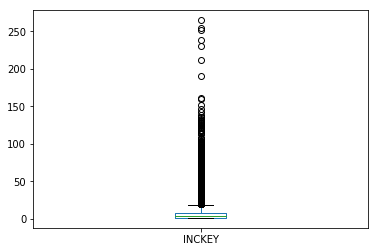

In [6]:
df_top_places_coord.plot.box (y = 'INCKEY')
plt.show()

In [7]:
# check the number of coolisions by date to see the trend.
df_collisions['INCDATE'] = pd.to_datetime( df_collisions['INCDATE'], format = '%Y/%m/%d' )
df_col_by_date = pd.DataFrame ( df_collisions.groupby ( df_collisions['INCDATE'].dt.year.astype(str) + '-' +
                                         df_collisions['INCDATE'].dt.month.astype(str).apply( lambda x: x.zfill(2) ) ) ['INCKEY'].count() )
df_col_by_date.reset_index(inplace = True)
df_col_by_date.columns = ('Month', 'incnum')


import time
df_col_by_date['time'] = pd.to_datetime( df_col_by_date['Month'], format = '%Y-%m' )
#time.mktime(df_col_by_date.Month.timetuple())
df_col_by_date['time'] = df_col_by_date['time'].apply ( lambda x: time.mktime ( x.timetuple() ) ) 
df_col_by_date.head ()

,Month,incnum,time
0,2004-01,976,1.072915e+09
1,2004-02,893,1.075594e+09
2,2004-03,1030,1.078099e+09
3,2004-04,1053,1.080778e+09
4,2004-05,1148,1.083370e+09


Text(0, 0.5, 'Number of incidents in a month')

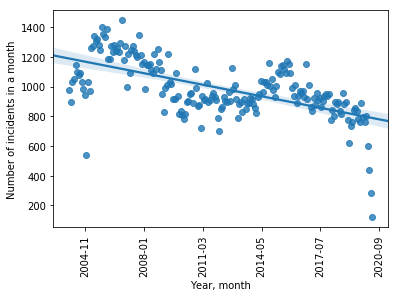

In [8]:
#df_col_by_date['Month'] = pd.to_datetime( df_col_by_date['Month'] + '-01', format = '%Y-%m-%d' )
import seaborn as sns
ax = sns.regplot (x = 'time', y = 'incnum', data = df_col_by_date )

xlabels  = pd.Series( ax.get_xticks() ).apply( lambda x: str(time.localtime(x)[0]) + '-' + str( time.localtime(x)[1]).zfill(2) ) 
ax.set_xticklabels ( xlabels, rotation = 90)
ax.set_xlabel ('Year, month')
ax.set_ylabel ('Number of incidents in a month')

#### Determine how weather condition affect the number of incidents in a certain day. Find out the dates, where the number of inicidents with particular weather conditions were at maximum levels:
    1. Fog/Smog/Smoke 	
    2. Raining
    3. Sleet/Hail/Freezing Rain
    4. Snowing

In [123]:
def weather_cond_test (condstr):
    df_test= df_collisions.loc[ df_collisions['WEATHER'] == condstr ]
    df_test= pd.DataFrame ( df_test.groupby ( df_test['strdate'] ) ['INCKEY'].count() )

    df_test.sort_values (by = 'INCKEY', ascending = False, inplace = True)

    df_test.columns = [condstr]
    df_test.reset_index (inplace = True)

    df_test['strmonth'] = df_test['strdate'].apply (lambda x: x[0:7])

    df_test= pd.merge ( df_test, df_collisions.groupby ( by = 'strdate' ) ['INCKEY'].count(), how = 'inner', on = 'strdate')
    df_test.rename (columns = {'INCKEY': 'day_total'}, inplace = True)

    df_test= pd.merge (df_test, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
    df_test.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

    df_test.sort_values (by = condstr, ascending = False, inplace = True)
    #df_col_fog.head()

    df_test_chart = df_test[['strdate', condstr, 'day_total']][df_test[condstr] > 1]
    df_test_chart['day_total'] = df_test_chart['day_total'] - df_test_chart[condstr]

    ax = df_test_chart.plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))
    #ax = df_test[['strdate', condstr, 'day_total']][df_test[condstr] > 1].plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))

    ax.legend(['Number of incidents with ' + condstr, 'Total number of incidents in a day'])
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off

    plt.title ('Number of incindents dependence on ' + condstr)
    plt.ylabel ('Number of incidents during a day')
    plt.xlabel ('Days')
    plt.show()

#### 1. Fog/Smog/Smoke

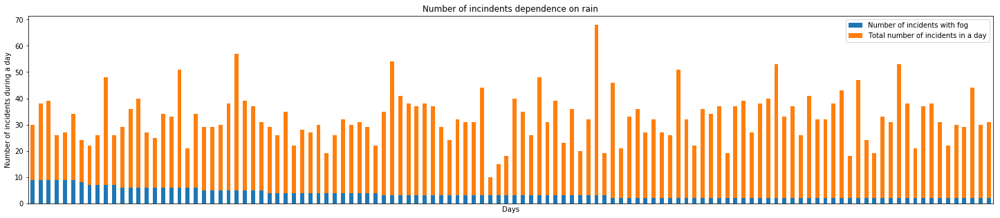

In [119]:
df_collisions['strmonth'] = ( df_collisions['INCDATE'].dt.year.astype(str) + '-' + 
                            df_collisions['INCDATE'].dt.month.astype(str).apply( lambda x: x.zfill(2) )
                           )

df_collisions['strdate'] = ( df_collisions['strmonth'] + '-' + 
                            df_collisions['INCDATE'].dt.day.astype(str).apply( lambda x: x.zfill(2) )
                           )

df_col_fog = df_collisions.loc[ df_collisions['WEATHER'] == 'Fog/Smog/Smoke' ]
df_col_fog = pd.DataFrame ( df_col_fog.groupby ( df_col_fog['strdate'] ) ['INCKEY'].count() )
#df_col_fog.reset_index (inplace = True)

#df_col_by_date.reset_index(inplace = True)
#df_col_by_date.columns = ('Month', 'incnum')
df_col_fog.sort_values (by = 'INCKEY', ascending = False, inplace = True)


#df_col_fog = df_collisions.loc [ df_collisions.groupby ]
#df_collisions.head()
df_col_fog.columns = ['numfog']
df_col_fog.reset_index (inplace = True)
#df_col_fog['total'] = df_collisions[ df_collisions[['strdate']] == df_col_fog[['strdate']] ]

df_col_fog['strmonth'] = df_col_fog['strdate'].apply (lambda x: x[0:7])
df_col_fog.head()


df_col_fog = pd.merge ( df_col_fog, df_collisions.groupby ( by = 'strdate' ) ['INCKEY'].count(), how = 'inner', on = 'strdate')
df_col_fog.rename (columns = {'INCKEY': 'day_total'}, inplace = True)
df_col_fog = pd.merge (df_col_fog, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
df_col_fog.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

df_col_fog.sort_values (by = 'numfog', ascending = False, inplace = True)
#df_col_fog.head()

df_col_fog_chart = df_col_fog[['strdate', 'numfog', 'day_total']][df_col_fog['numfog'] > 1]
df_col_fog_chart['day_total'] = df_col_fog_chart['day_total'] - df_col_fog_chart['numfog']

ax = df_col_fog_chart.plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))
ax.legend(['Number of incidents with fog', 'Total number of incidents in a day'])

plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
plt.title ('Number of incindents dependence on rain')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Days')

plt.show()

In [98]:
df_col_fog[['strdate', 'numfog', 'day_total', 'month_average']].corr()[['numfog']]

,numfog
numfog,1.000000
day_total,-0.039717
month_average,-0.045658


In [102]:
df_col_fog.head()

,strdate,numfog,strmonth,day_total,month_average
0,2015-11-29,9,2015-11,30,38.366667
18,2013-10-22,9,2013-10,38,30.800000
3,2013-01-17,9,2013-01,39,30.533333
4,2013-01-19,9,2013-01,26,30.533333
12,2018-10-22,9,2018-10,27,31.966667


Text(0.5, 0, 'Number of incidents during a day with fog')

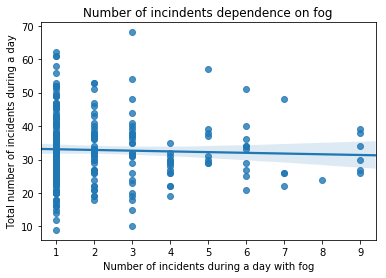

In [115]:
sns.regplot (x = 'numfog', y = 'day_total', data = df_col_fog)
plt.title ('Number of incindents dependence on fog')
plt.ylabel ('Total number of incidents during a day')
plt.xlabel ('Number of incidents during a day with fog')

#### 2. Raining

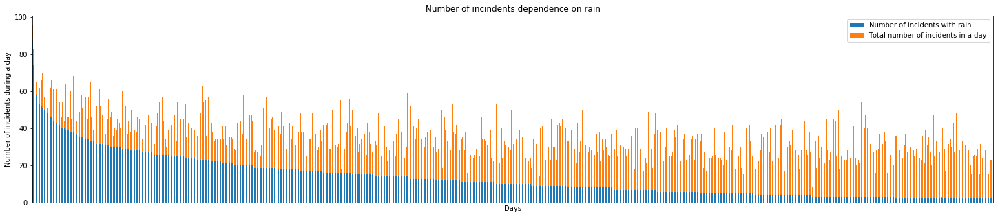

In [117]:
df_col_rain = df_collisions.loc[ df_collisions['WEATHER'] == 'Raining' ]
df_col_rain = pd.DataFrame ( df_col_rain.groupby ( df_col_rain['strdate'] ) ['INCKEY'].count() )

df_col_rain.sort_values (by = 'INCKEY', ascending = False, inplace = True)

df_col_rain.columns = ['numrain']
df_col_rain.reset_index (inplace = True)

df_col_rain['strmonth'] = df_col_rain['strdate'].apply (lambda x: x[0:7])

df_col_rain = pd.merge ( df_col_rain, df_collisions.groupby ( by = 'strdate' ) ['INCKEY'].count(), how = 'inner', on = 'strdate')
df_col_rain.rename (columns = {'INCKEY': 'day_total'}, inplace = True)

df_col_rain = pd.merge (df_col_rain, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
df_col_rain.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

df_col_rain.sort_values (by = 'numrain', ascending = False, inplace = True)
#df_col_fog.head()

df_col_rain_chart = df_col_rain[['strdate', 'numrain', 'day_total']][df_col_rain['numrain'] > 1]
df_col_rain_chart['day_total'] = df_col_rain_chart['day_total'] - df_col_rain_chart['numrain']

ax = df_col_rain_chart.plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))
#ax = df_col_rain[['strdate', 'numrain', 'day_total']][df_col_rain['numrain'] > 1].plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))

ax.legend(['Number of incidents with rain', 'Total number of incidents in a day'])
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

plt.title ('Number of incindents dependence on rain')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Days')
plt.show()

In [109]:
df_col_rain[['strdate', 'numrain', 'day_total', 'month_average']].corr()[['numrain']]

,numrain
numrain,1.000000
day_total,0.647928
month_average,0.203968


Text(0.5, 0, 'Number of incidents during a day with rain')

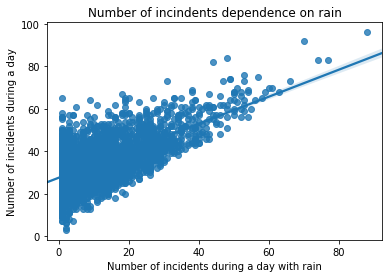

In [118]:
sns.regplot (x = 'numrain', y = 'day_total', data = df_col_rain)
plt.title ('Number of incindents dependence on rain')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Number of incidents during a day with rain')

#### 3. Sleet/Hail/Freezing Rain

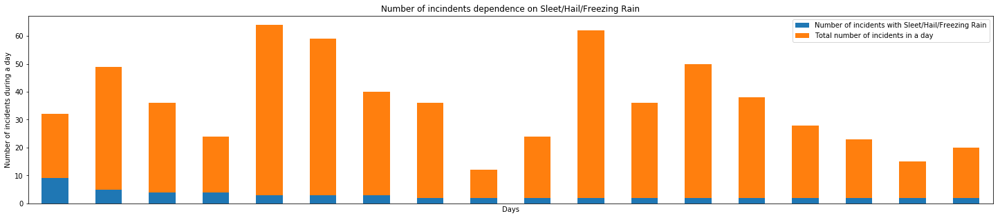

In [125]:
weather_cond_test ('Sleet/Hail/Freezing Rain')

In [121]:
df_col_sleet[['strdate', 'numsleet', 'day_total', 'month_average']].corr()[['numsleet']]

,numsleet
numsleet,1.000000
day_total,0.062614
month_average,-0.083432


Text(0.5, 0, 'Number of incidents during a day with sleet')

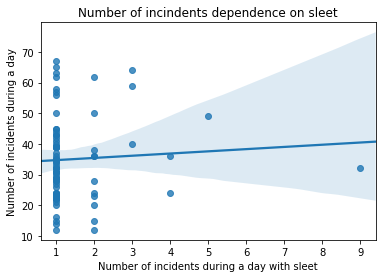

In [122]:
sns.regplot (x = 'numsleet', y = 'day_total', data = df_col_sleet)
plt.title ('Number of incindents dependence on sleet')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Number of incidents during a day with sleet')

#### 4. Snowing

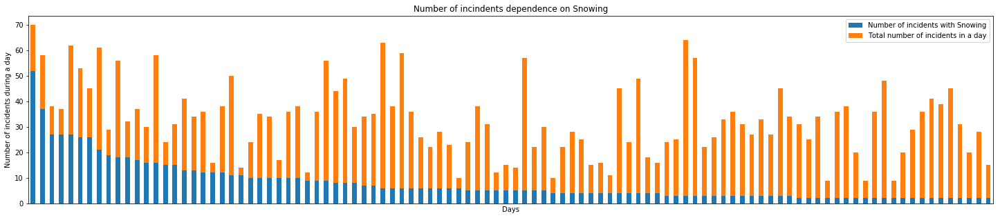

In [124]:
weather_cond_test ('Snowing')

In [5]:
# add location 

df_loc_names.reset_index ( inplace = True)
df_top_places_coord.reset_index ( inplace = True)
#df_top_places_coord.drop (['index'], axis = 1, inplace = True)

# get location name for each X, Y coordinate

df_loc_names = df_col[['X', 'Y', 'LOCATION']].drop_duplicates(subset = ['X', 'Y'])

df_loc_names.set_index (['X', 'Y'], inplace = True)
df_top_places_coord.set_index (['X', 'Y'], inplace = True)

df_top_places_data = pd.merge( df_loc_names, df_top_places_coord, 
                                left_index = True,
                              right_index = True,
                                how = 'inner',
                              validate = "one_to_one"
                             )
print (df_top_places_coord.head())
df_top_places_data.reset_index( inplace = True )
df_top_places_data.rename ( columns = {'INCKEY': "inc_num"}, inplace = True )

NameError: name 'df_loc_names' is not defined

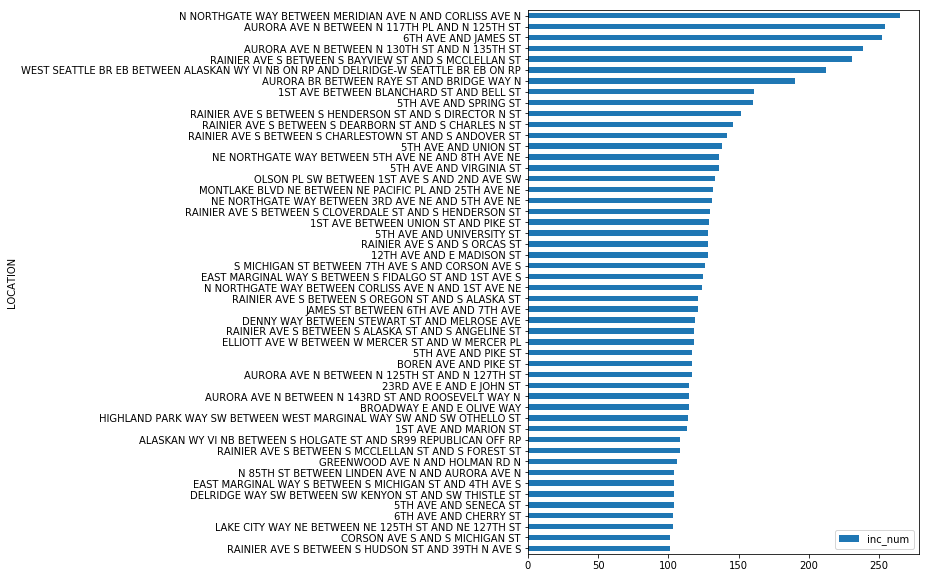

In [67]:
#df_top_places_data['inc_num'] = df_top_places_data['inc_num'].astype (str)
df_top_places_data.sort_values ( by = 'inc_num', inplace = True, ascending = False )
df_top_places_data = df_top_places_data.iloc[0:50]

df_top_places_data.sort_values( by = 'inc_num' ).plot.barh( x = 'LOCATION', y = 'inc_num', figsize = (7, 10) )

plt.show()


In [69]:
df_top_places = pd.DataFrame(df_col.iloc[0:0])

df_top_places_coord.reset_index (inplace = True)
#for x, y in df_top_places_coord[['X', 'Y']].values:
        df_top_places = df_top_places.append( 
            df_col[ (df_col['X'] == x) & (df_col['Y'] == y) ],
            ignore_index = True )

df_top_places

KeyboardInterrupt: 

In [70]:
df_top_places.to_csv ('top_places.csv')

from project_lib import Project
project = Project( "", "aafac36c-58f4-4a11-8c05-21acabfe3b46","p-a80f6da3f8a403b3be827803052abdf55c6450af")

#project.save_data(file_name = "top_places.csv", data = df_top_places.to_csv(index=False))

File 'top_places.csv' already exists in storage.

2020-08-29 17:56:54,494 - __PROJECT_LIB__ - ERROR - File 'top_places.csv' already exists in storage.
RuntimeError: File 'top_places.csv' already exists in storage.


RuntimeError: File 'top_places.csv' already exists in storage.

In [66]:
#from folium import plugins
df_
# map of Seattle
st_top_map = folium.Map(location = [st_lat, st_lng], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_top_places.Y, df_top_places.X, df_top_places.ST_COLDESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
st_top_map

NameError: name 'X' is not defined

In [8]:
df_col.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [71]:

body = client_5ce6ac756ad142ccb72a01980ae51ec3.get_object(Bucket='datasciencecapstone-donotdelete-pr-ajuqjizdxwwzr6',Key='top_places.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_top_places = pd.read_csv(body)
df_top_places.head()


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.332653,47.708655,2305,76800,76800,2620638,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,7117042.0,Y,14,From same direction - both going straight - on...,0,0,N
1,2,-122.332653,47.708655,2860,17939,17939,1794180,Matched,Block,NaN,...,Dry,Daylight,NaN,4280017.0,NaN,21,One car entering driveway access,0,0,N
2,2,-122.332653,47.708655,3080,16519,16519,3503143,Matched,Block,NaN,...,Wet,Dawn,NaN,NaN,NaN,14,From same direction - both going straight - on...,0,0,N
3,2,-122.332653,47.708655,3642,16877,16877,3507818,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,14,From same direction - both going straight - on...,0,0,N
4,1,-122.332653,47.708655,3647,17093,17093,1779712,Matched,Block,NaN,...,Dry,Daylight,NaN,4077010.0,NaN,0,Vehicle going straight hits pedestrian,0,0,N


In [72]:
df_roadcond_top = df_top_places[['INCKEY', 'SEVERITYCODE', 'ROADCOND']].groupby(['ROADCOND', 'SEVERITYCODE'], as_index = False).count()
df_roadcond_top.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'Top'}, inplace = True )
df_roadcond_top = df_roadcond_top.pivot(index='ROADCOND',columns='Severity')
df_roadcond_top.columns = ['Sev1_top', 'Sev2_top']
#df_roadcond_top['Top'] = df_roadcond_top['Top'] / df_roadcond_top['Top'].sum()* 100
df_roadcond_top = df_roadcond_top / df_top_places['INCKEY'].count()* 100
df_roadcond_top

,Sev1_top,Sev2_top
ROADCOND,,
Dry,42.524179,23.032236
Ice,0.336203,0.132136
Oil,0.020329,0.012510
Other,0.029711,0.018765
Sand/Mud/Dirt,0.008601,0.009382
Snow/Slush,0.294764,0.086787
Standing Water,0.042221,0.016419
Unknown,4.583304,0.414389
Wet,16.491919,9.226030


In [73]:
df_roadcond_all = df_col[['INCKEY', 'SEVERITYCODE', 'ROADCOND']].groupby(['ROADCOND', 'SEVERITYCODE'], as_index = False).count()
df_roadcond_all.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'All'}, inplace = True)
#df_roadcond_all['All'] = df_roadcond_all['All'] / df_roadcond_all['All'].sum()* 100
df_roadcond_all = df_roadcond_all.pivot(index='ROADCOND',columns='Severity')
df_roadcond_all.columns = ['Sev1_all', 'Sev2_all']

print ("df_col total: ", df_col['INCKEY'].count())
print ("df_roadcond_all total: ", df_roadcond_all.sum())
df_roadcond_all = df_roadcond_all / df_col['INCKEY'].count() * 100

df_roadcond_all

df_col total:  189339
df_roadcond_all total:  Sev1_all    128392
Sev2_all     56089
dtype: int64


,Sev1_all,Sev2_all
ROADCOND,,
Dry,43.633377,20.841454
Ice,0.481148,0.140489
Oil,0.017429,0.010563
Other,0.041196,0.020598
Sand/Mud/Dirt,0.022182,0.011619
Snow/Slush,0.434670,0.087673
Standing Water,0.040140,0.013732
Unknown,6.932011,0.377101
Wet,16.208494,8.120356


In [74]:
df_roadcond = pd.concat( [df_roadcond_all, df_roadcond_top], axis = 1 )
df_roadcond

,Sev1_all,Sev2_all,Sev1_top,Sev2_top
ROADCOND,,,,
Dry,43.633377,20.841454,42.524179,23.032236
Ice,0.481148,0.140489,0.336203,0.132136
Oil,0.017429,0.010563,0.020329,0.012510
Other,0.041196,0.020598,0.029711,0.018765
Sand/Mud/Dirt,0.022182,0.011619,0.008601,0.009382
Snow/Slush,0.434670,0.087673,0.294764,0.086787
Standing Water,0.040140,0.013732,0.042221,0.016419
Unknown,6.932011,0.377101,4.583304,0.414389
Wet,16.208494,8.120356,16.491919,9.226030


In [81]:
df_roadcond = pd.concat( [df_roadcond_all, df_roadcond_top], axis = 1 )
cond_order = ['Dry', 'Wet', 'Unknown', 'Ice', 'Snow/Slush', 'Other', 'Standing Water', 'Sand/Mud/Dirt', 'Oil' ]
df_roadcond.reindex (cond_order)
#df_roadcond

,Sev1_all,Sev2_all,Sev1_top,Sev2_top
ROADCOND,,,,
Dry,43.633377,20.841454,42.524179,23.032236
Wet,16.208494,8.120356,16.491919,9.226030
Unknown,6.932011,0.377101,4.583304,0.414389
Ice,0.481148,0.140489,0.336203,0.132136
Snow/Slush,0.434670,0.087673,0.294764,0.086787
Other,0.041196,0.020598,0.029711,0.018765
Standing Water,0.040140,0.013732,0.042221,0.016419
Sand/Mud/Dirt,0.022182,0.011619,0.008601,0.009382
Oil,0.017429,0.010563,0.020329,0.012510


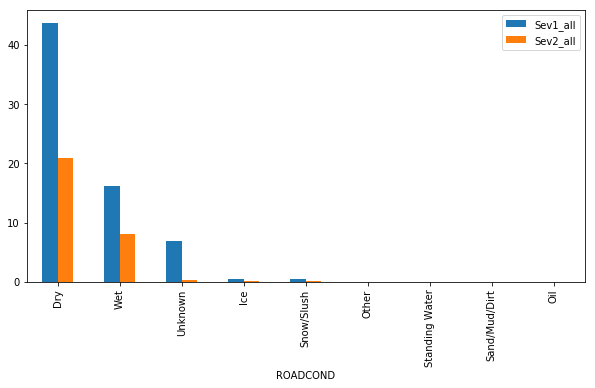

In [86]:

df_roadcond_all.reindex (cond_order).plot.bar (figsize = (10,5))
plt.show()

Study dependency of the number of collisions on the weather conditions.

In [87]:
df_weathercond_all = df_col[['INCKEY', 'SEVERITYCODE', 'WEATHER']].groupby(['WEATHER', 'SEVERITYCODE'], as_index = False).count()
df_weathercond_all.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'All'}, inplace = True)
#df_roadcond_all['All'] = df_roadcond_all['All'] / df_roadcond_all['All'].sum()* 100
df_weathercond_all = df_weathercond_all.pivot(index='WEATHER',columns='Severity')
df_weathercond_all.columns = ['Sev1_all', 'Sev2_all']

print ("df_col total: ", df_col['INCKEY'].count())
print ("df_weathercond_all total: ", df_weathercond_all.sum())
df_weathercond_all = df_weathercond_all / df_col['INCKEY'].count() * 100

df_weathercond_all

df_col total:  189339
df_weathercond_all total:  Sev1_all    128349
Sev2_all     56065
dtype: int64


,Sev1_all,Sev2_all
WEATHER,,
Blowing Sand/Dirt,0.019542,0.006866
Clear,38.902181,18.644865
Fog/Smog/Smoke,0.194889,0.097180
Other,0.350166,0.058097
Overcast,9.785094,4.546871
Partly Cloudy,0.001056,0.001584
Raining,11.170968,5.737856
Severe Crosswind,0.008979,0.003697
Sleet/Hail/Freezing Rain,0.044893,0.014260


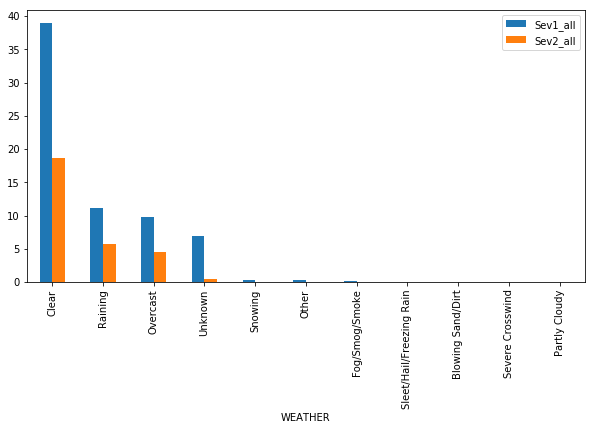

In [89]:
cond_order = ['Clear', 'Raining', 'Overcast', 'Unknown', 'Snowing', 'Other', 'Fog/Smog/Smoke', 'Sleet/Hail/Freezing Rain', 'Blowing Sand/Dirt', 'Severe Crosswind', 'Partly Cloudy']
df_weathercond_all.reindex (cond_order).plot.bar (figsize = (10,5))
plt.show()